In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = "https://raw.githubusercontent.com/Mechademy-Git/DS-Intern-Assignment/main/data/data.csv"

In [3]:
df = pd.read_csv(data)
df.head()

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
0,2016-01-11 17:00:00,60.0,-77.78778596503064,33.74660933896648,47.59666666666671,19.2,44.790000,19.79,NaN,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60.0,30.0,19.89,46.69333333333329,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50.0,30.0,19.89,46.3,19.2,44.626667,19.79,44.933333,35.921144,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50.0,40.0,33.74660933896648,46.0666666666667,19.2,44.590000,19.79,45.000000,NaN,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,37.673716,45.410389,45.410389
4,2016-01-11 17:40:00,60.0,40.0,19.89,46.33333333333329,19.2,44.530000,19.79,45.000000,18.890000,...,4.476511,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.900000,10.084097,10.084097


In [5]:
df.shape

(16857, 29)

In [4]:

df.isnull().sum()

timestamp                         0
equipment_energy_consumption    844
lighting_energy                 809
zone1_temperature               867
zone1_humidity                  801
zone2_temperature               853
zone2_humidity                  867
zone3_temperature               802
zone3_humidity                  878
zone4_temperature               816
zone4_humidity                  781
zone5_temperature               838
zone5_humidity                  801
zone6_temperature               848
zone6_humidity                  847
zone7_temperature               794
zone7_humidity                  805
zone8_temperature               848
zone8_humidity                  777
zone9_temperature               773
zone9_humidity                  888
outdoor_temperature             806
atmospheric_pressure            842
outdoor_humidity                799
wind_speed                      828
visibility_index                815
dew_point                       826
random_variable1            

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16857 entries, 0 to 16856
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   timestamp                     16857 non-null  object 
 1   equipment_energy_consumption  16013 non-null  object 
 2   lighting_energy               16048 non-null  object 
 3   zone1_temperature             15990 non-null  object 
 4   zone1_humidity                16056 non-null  object 
 5   zone2_temperature             16004 non-null  object 
 6   zone2_humidity                15990 non-null  float64
 7   zone3_temperature             16055 non-null  float64
 8   zone3_humidity                15979 non-null  float64
 9   zone4_temperature             16041 non-null  float64
 10  zone4_humidity                16076 non-null  float64
 11  zone5_temperature             16019 non-null  float64
 12  zone5_humidity                16056 non-null  float64
 13  z

In [13]:
df['timestamp']=pd.to_datetime(df['timestamp'],errors="coerce")

In [ ]:
import pandas as pd
import logging

# Configure logging
logging.basicConfig(
    filename="pipeline.log",
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s"
)

class DataPreprocessing:

    def convert_column(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Converts 'timestamp' to datetime and other object columns to numeric using .loc to avoid SettingWithCopyWarning.
        """
        if "timestamp" in df.columns:
            df.loc[:, 'timestamp'] = pd.to_datetime(df['timestamp'], errors='coerce')
            
        object_cols = df.select_dtypes(include=['object']).columns
        for col in object_cols:
            df.loc[:, col] = pd.to_numeric(df[col], errors='coerce')
        
        return df


    def find_duplicate_rows(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Returns duplicate rows in the DataFrame.
        """
        duplicates = df[df.duplicated()]
        logging.info(f"Found {len(duplicates)} duplicate rows.")
        return duplicates

    def remove_duplicated(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Removes duplicate rows from the DataFrame.
        """
        original_shape = df.shape
        df = df.drop_duplicates()
        logging.info(f"Removed duplicates. Shape changed from {original_shape} to {df.shape}.")
        return df

    def fill_missing_values(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Fills missing values with the median of each column using .loc to avoid SettingWithCopyWarning.
        """
        for col in df.columns:
            if df[col].isnull().sum() > 0:
                median = df[col].median()
                df.loc[df[col].isnull(), col] = median
                logging.info(f"Filled missing values in '{col}' with median: {median}")
        return df



In [24]:
preprocessing = DataPreprocessing()
preprocessing.convert_column(df)
duplicates = preprocessing.find_duplicate_rows(df)
df = preprocessing.remove_duplicated(df)
df = preprocessing.fill_missing_values(df)
df

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
0,2016-01-11 17:00:00,60.000000,-77.787786,33.746609,47.596667,19.200000,44.790000,19.79,38.400000,19.000000,...,17.033333,45.53,6.600000,733.500000,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60.000000,30.000000,19.890000,46.693333,19.200000,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50.000000,30.000000,19.890000,46.300000,19.200000,44.626667,19.79,44.933333,35.921144,...,17.000000,45.50,6.366667,733.700000,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50.000000,40.000000,33.746609,46.066667,19.200000,44.590000,19.79,45.000000,20.290000,...,17.000000,45.40,6.250000,733.800000,92.000000,6.000000,51.500000,37.673716,45.410389,45.410389
4,2016-01-11 17:40:00,60.000000,40.000000,19.890000,46.333333,19.200000,44.530000,19.79,45.000000,18.890000,...,4.476511,45.40,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16852,2016-10-03 20:10:00,1139.985693,20.000000,22.100000,38.723333,19.790000,39.566667,21.29,38.845000,21.390000,...,18.100000,40.09,5.816667,761.466667,68.333333,2.000000,64.666667,0.366667,10.707282,10.707282
16853,2016-10-04 06:10:00,50.000000,86.002966,21.290000,39.626667,18.100000,44.290000,22.39,38.760000,20.290000,...,20.200000,44.50,3.683333,752.250000,96.666667,1.000000,18.000000,3.150000,49.199695,49.199695
16854,2016-11-03 00:50:00,50.000000,0.000000,21.390000,37.590000,18.463333,39.966667,21.10,37.790000,20.600000,...,18.100000,40.20,1.750000,763.000000,84.166667,1.000000,60.833333,-0.633333,6.905370,6.905370
16855,2016-11-04 13:20:00,80.000000,0.000000,22.500000,39.360000,23.600000,35.730000,23.10,38.000000,22.290000,...,21.100000,39.53,16.800000,750.166667,50.333333,6.000000,40.000000,6.266667,25.020775,25.020775


In [29]:
df.describe()

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
count,16789,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,...,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000,16789.000000
mean,2016-03-10 02:06:37.796176128,93.849641,3.733519,21.252833,39.056043,19.782432,39.530067,21.671330,38.208297,20.242780,...,18.852129,40.317575,6.208698,755.783151,79.205768,4.186947,38.520045,2.779382,24.884121,25.101373
min,2016-01-11 17:00:00,-1139.985693,-86.002966,8.726818,-46.660000,2.988199,-77.265503,6.543921,-71.406273,4.613485,...,4.476511,-81.582494,-37.524768,678.159940,-221.668765,-20.929527,-82.329792,-32.098095,-120.170177,-120.409590
25%,2016-02-09 20:40:00,50.000000,0.000000,20.600000,37.126667,18.666667,37.933333,20.600000,36.750000,19.290000,...,17.890000,38.363333,3.183333,751.100000,72.000000,2.000000,29.000000,0.588889,12.814858,12.814678
50%,2016-03-09 23:50:00,60.000000,0.000000,21.323333,39.230000,19.600000,40.295833,21.767500,38.400000,20.290000,...,18.890000,40.363333,6.000000,756.216667,84.166667,4.000000,40.000000,2.750000,24.874799,24.838493
75%,2016-04-08 03:40:00,90.000000,0.000000,22.100000,42.326667,20.700000,42.790000,22.700000,41.000000,21.290000,...,20.100000,43.500000,9.066667,761.741667,91.500000,5.666667,40.000000,5.150000,37.247027,37.284909
max,2016-12-01 15:50:00,1139.985693,86.002966,33.746609,76.292756,36.552882,77.265503,36.823982,71.406273,35.921144,...,33.238012,81.582494,49.853906,833.392675,221.668765,29.318719,159.606156,37.673716,170.156325,170.329617
std,NaN,177.699840,14.246199,2.102127,9.700686,2.854628,9.880866,2.532934,9.888550,2.710746,...,2.473488,10.890077,7.380444,13.317979,27.924112,4.306280,20.743399,5.933585,25.526647,24.874223


In [25]:
df.isnull().sum()

timestamp                       0
equipment_energy_consumption    0
lighting_energy                 0
zone1_temperature               0
zone1_humidity                  0
zone2_temperature               0
zone2_humidity                  0
zone3_temperature               0
zone3_humidity                  0
zone4_temperature               0
zone4_humidity                  0
zone5_temperature               0
zone5_humidity                  0
zone6_temperature               0
zone6_humidity                  0
zone7_temperature               0
zone7_humidity                  0
zone8_temperature               0
zone8_humidity                  0
zone9_temperature               0
zone9_humidity                  0
outdoor_temperature             0
atmospheric_pressure            0
outdoor_humidity                0
wind_speed                      0
visibility_index                0
dew_point                       0
random_variable1                0
random_variable2                0
dtype: int64

In [30]:
def remove_outliers(df: pd.DataFrame) -> pd.DataFrame:
    """
    Removes rows with outliers from the entire DataFrame (excluding 'timestamp') using the IQR method.
    A row is removed if any of its values are outliers in their respective columns.
    """
    logging.info("Starting global outlier detection using IQR...")

    # Exclude timestamp
    numeric_cols = df.select_dtypes(include=['number']).columns
    numeric_cols = [col for col in numeric_cols if col != 'timestamp']

    # Create a mask for non-outlier rows (initially all True)
    non_outlier_mask = pd.Series(True, index=df.index)

    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        mask = (df[col] >= lower_bound) & (df[col] <= upper_bound)
        non_outlier_mask &= mask  # Keep only rows that are non-outliers for all columns

    original_shape = df.shape
    df = df[non_outlier_mask]
    logging.info(f"Outlier removal complete. Shape before: {original_shape}, after: {df.shape}")

    return df


In [31]:
remove_outliers(df)

,timestamp,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
51,2016-01-12 01:30:00,50.0,0.0,20.926667,45.590000,20.290000,44.290000,20.166667,45.530000,21.890000,...,16.890000,46.290000,5.150000,737.900000,92.000000,4.000000,40.0,3.950000,43.060474,43.060474
53,2016-01-12 01:50:00,50.0,0.0,20.890000,46.060000,20.200000,44.400000,20.200000,45.500000,21.666667,...,16.890000,46.633333,5.183333,738.166667,92.000000,5.166667,40.0,3.983333,12.239864,12.239864
55,2016-01-12 02:10:00,50.0,0.0,21.323333,46.200000,20.100000,44.530000,20.125000,45.425000,21.356667,...,16.963333,46.966667,5.133333,738.400000,92.000000,4.000000,40.0,3.933333,4.973308,4.973308
57,2016-01-12 02:30:00,50.0,0.0,20.700000,46.200000,20.000000,44.433333,20.200000,38.400000,21.066667,...,17.000000,47.363333,5.000000,738.600000,92.000000,4.500000,40.0,3.800000,24.874799,25.931713
58,2016-01-12 02:40:00,40.0,0.0,20.600000,46.200000,20.000000,44.500000,20.200000,38.400000,20.926667,...,17.000000,47.530000,4.933333,756.216667,92.000000,4.333333,40.0,3.733333,33.100254,33.100254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16844,2016-05-07 04:20:00,40.0,0.0,23.790000,37.730000,21.633333,39.066667,24.500000,38.126667,23.600000,...,21.790000,43.290000,12.033333,752.033333,84.166667,1.000000,40.0,5.466667,25.197838,25.197838
16845,2016-05-07 04:30:00,60.0,0.0,21.323333,39.230000,21.633333,40.295833,24.500000,38.200000,23.600000,...,21.790000,43.400000,12.000000,752.000000,64.500000,1.000000,40.0,5.400000,41.848600,41.848600
16847,2016-07-04 16:00:00,50.0,0.0,21.323333,39.626667,21.790000,38.363333,22.650000,38.450000,21.566667,...,20.790000,41.090000,10.600000,752.700000,59.000000,6.000000,29.0,2.900000,23.180637,23.180637
16851,2016-10-02 12:00:00,80.0,0.0,20.700000,42.826667,20.000000,40.590000,21.200000,41.230000,19.500000,...,19.200000,44.595000,5.500000,741.800000,88.000000,4.000000,40.0,3.600000,6.238859,6.238859


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16857 entries, 0 to 16856
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   timestamp                     16857 non-null  object 
 1   equipment_energy_consumption  15945 non-null  float64
 2   lighting_energy               15993 non-null  float64
 3   zone1_temperature             15908 non-null  float64
 4   zone1_humidity                15969 non-null  float64
 5   zone2_temperature             15934 non-null  float64
 6   zone2_humidity                15990 non-null  float64
 7   zone3_temperature             16055 non-null  float64
 8   zone3_humidity                15979 non-null  float64
 9   zone4_temperature             16041 non-null  float64
 10  zone4_humidity                16076 non-null  float64
 11  zone5_temperature             16019 non-null  float64
 12  zone5_humidity                16056 non-null  float64
 13  z

In [10]:
df.columns

Index(['timestamp', 'equipment_energy_consumption', 'lighting_energy',
       'zone1_temperature', 'zone1_humidity', 'zone2_temperature',
       'zone2_humidity', 'zone3_temperature', 'zone3_humidity',
       'zone4_temperature', 'zone4_humidity', 'zone5_temperature',
       'zone5_humidity', 'zone6_temperature', 'zone6_humidity',
       'zone7_temperature', 'zone7_humidity', 'zone8_temperature',
       'zone8_humidity', 'zone9_temperature', 'zone9_humidity',
       'outdoor_temperature', 'atmospheric_pressure', 'outdoor_humidity',
       'wind_speed', 'visibility_index', 'dew_point', 'random_variable1',
       'random_variable2'],
      dtype='object')

In [34]:
df.drop("timestamp",axis=1).corr()

,equipment_energy_consumption,lighting_energy,zone1_temperature,zone1_humidity,zone2_temperature,zone2_humidity,zone3_temperature,zone3_humidity,zone4_temperature,zone4_humidity,...,zone9_temperature,zone9_humidity,outdoor_temperature,atmospheric_pressure,outdoor_humidity,wind_speed,visibility_index,dew_point,random_variable1,random_variable2
equipment_energy_consumption,1.000000,0.054014,0.018232,0.025452,0.039490,-0.003914,0.036694,0.006342,0.016585,-0.003628,...,0.004816,-0.022466,0.031596,-0.012924,-0.036816,0.010664,0.000394,-0.001249,-0.015751,-0.010667
lighting_energy,0.054014,1.000000,0.021957,0.047884,0.022012,0.015678,-0.009158,0.023465,0.030151,0.022857,...,-0.044659,0.018409,0.005165,-0.000549,0.013808,0.007120,0.005105,0.008118,0.004654,-0.002700
zone1_temperature,0.018232,0.021957,1.000000,-0.009013,0.222564,-0.030237,0.237779,-0.012793,0.214930,-0.017443,...,0.216063,-0.010950,0.150547,-0.025373,-0.077157,0.009387,-0.020502,0.092404,-0.002777,-0.002855
zone1_humidity,0.025452,0.047884,-0.009013,1.000000,0.030292,0.087665,0.003280,0.083632,-0.035813,0.116969,...,-0.037307,0.093624,0.041540,-0.052151,0.047092,0.061953,-0.010864,0.105145,-0.015438,-0.007989
zone2_temperature,0.039490,0.022012,0.222564,0.030292,1.000000,-0.053100,0.173892,0.030393,0.167915,0.029476,...,0.134080,0.005018,0.206900,-0.022001,-0.129710,0.062162,-0.020018,0.113943,0.004849,-0.013923
zone2_humidity,-0.003914,0.015678,-0.030237,0.087665,-0.053100,1.000000,0.009675,0.056307,-0.039508,0.101719,...,-0.015068,0.076476,0.005387,-0.040046,0.092564,0.017515,-0.013338,0.103472,-0.003665,-0.005180
zone3_temperature,0.036694,-0.009158,0.237779,0.003280,0.173892,0.009675,1.000000,-0.039883,0.216040,-0.015776,...,0.241028,-0.008531,0.166735,-0.044587,-0.063393,0.011953,-0.028976,0.122397,-0.010976,0.000013
zone3_humidity,0.006342,0.023465,-0.012793,0.083632,0.030393,0.056307,-0.039883,1.000000,-0.058611,0.092062,...,-0.069808,0.081180,0.003293,-0.022179,0.036428,0.050610,-0.002658,0.075106,-0.006171,0.005569
zone4_temperature,0.016585,0.030151,0.214930,-0.035813,0.167915,-0.039508,0.216040,-0.058611,1.000000,-0.058977,...,0.222353,-0.048773,0.138763,0.002806,-0.106132,-0.024661,-0.034571,0.075168,0.001018,-0.001202
zone4_humidity,-0.003628,0.022857,-0.017443,0.116969,0.029476,0.101719,-0.015776,0.092062,-0.058977,1.000000,...,-0.068939,0.120412,0.037448,-0.033052,0.072637,0.080294,-0.003313,0.110881,-0.001061,0.003627


<Axes: >

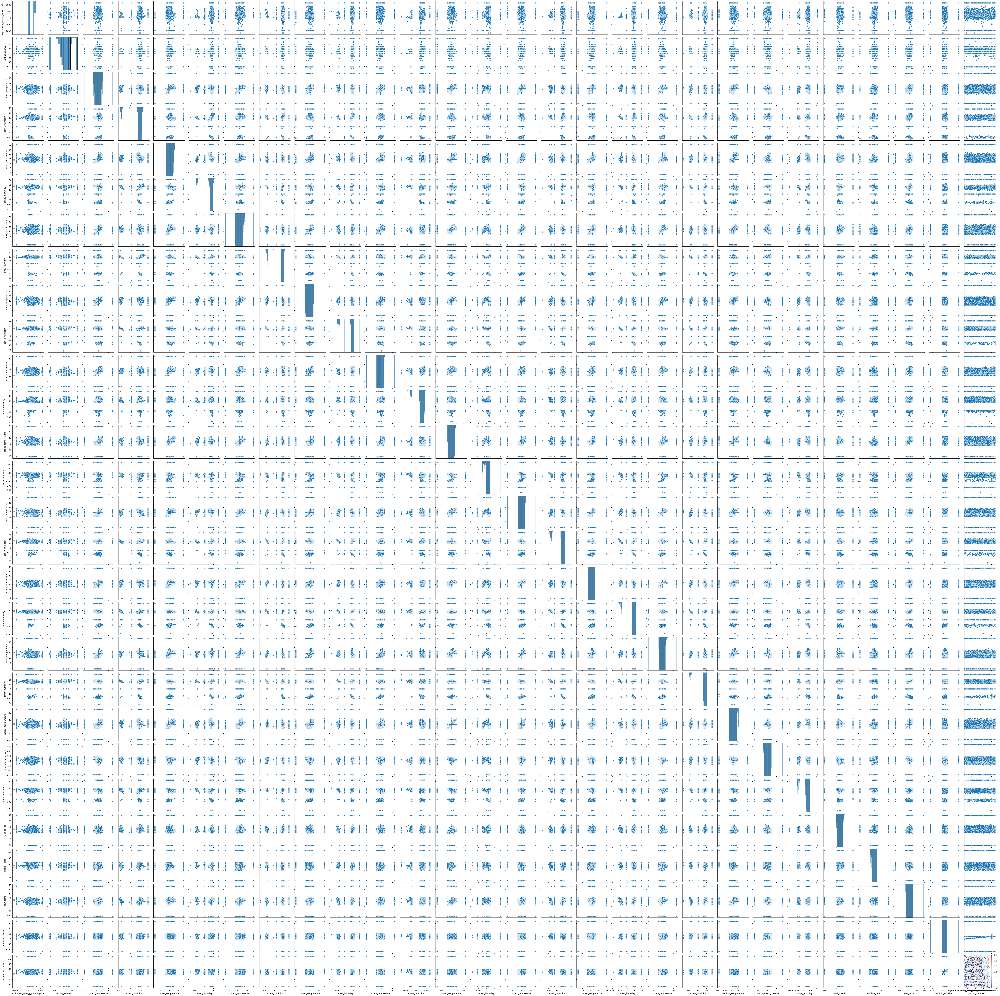

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df.drop("timestamp",axis=1))
sns.heatmap(df.drop("timestamp",axis=1).corr(), annot=True, cmap="coolwarm")


In [ ]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)

# Optional: Get feature names
feature_names = poly.get_feature_names_out(X.columns)
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
